# Week 6 - Bivariate Analysis, part 2

# 1. Lesson: no lesson this week

# 2. Weekly graph question

Suppose you wanted to show the nitrate and phosphate level in a water sample.  What are the advantages and disadvantages of showing this as an area plot, as opposed to two separate line graphs?  How would you adjust the graphs shown to improve the presentation?

In [2]:
import numpy as np
import seaborn as sns
import pandas as pd

Text(0, 0.5, 'Nitrate level (% of eutrophic value)')

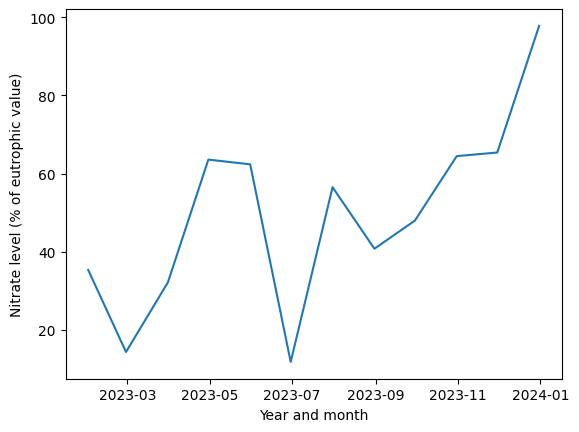

In [3]:
numdates = 12
np.random.seed(0)
time_series = 100 * (np.random.normal(size = numdates) / 5 + np.arange(numdates) / 16)
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series)
ax.set_xlabel("Year and month")
ax.set_ylabel("Nitrate level (% of eutrophic value)")

Text(0, 0.5, 'Phosphate level (% of eutrophic value)')

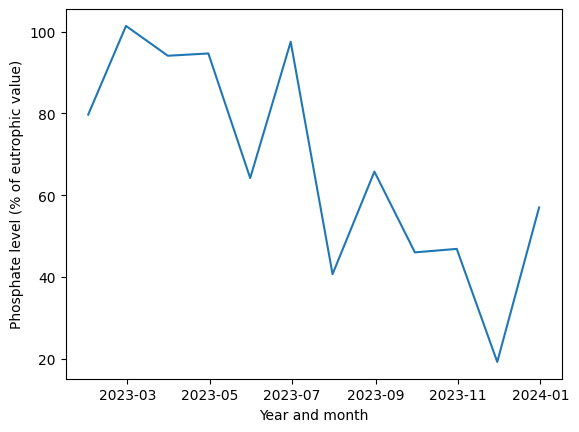

In [5]:
np.random.seed(1)
time_series_2 =  100 * (1 - (np.random.normal(size = numdates) / 8 + np.arange(numdates) / 16))
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series_2)
ax.set_xlabel("Year and month")
ax.set_ylabel("Phosphate level (% of eutrophic value)")

<Axes: >

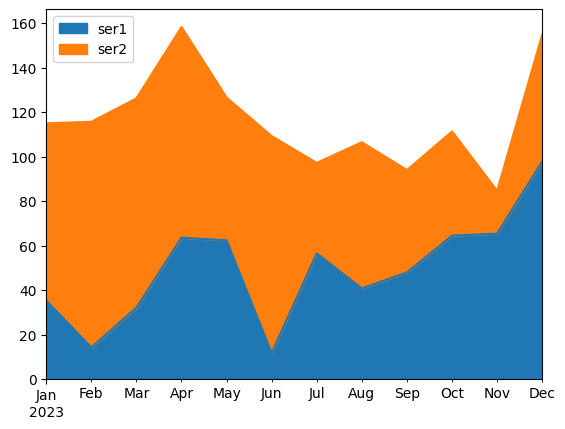

In [6]:
df = pd.DataFrame({'ser1': time_series, 'ser2': time_series_2}, index = datearray)
df.plot.area()

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

### Here are some types of analysis you can do:

- Find correlations between pairs of variables.

- Draw scatterplots, especially when the correlation is large.

- Draw pairplots.

- Draw line graphs and/or area graphs when there is date or time data together with numerical data.

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!

- Do you see any outliers?  (Data points that are far from the rest of the data).

- Are any data items highly correlated with each other, suggesting that they are redundant?

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)

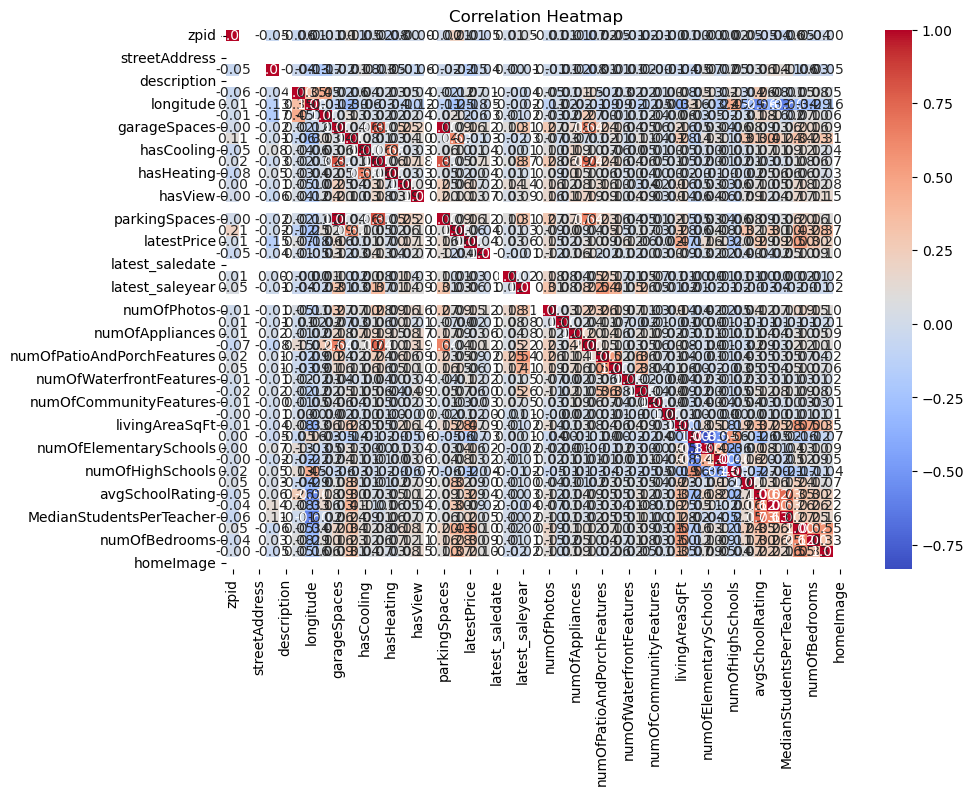

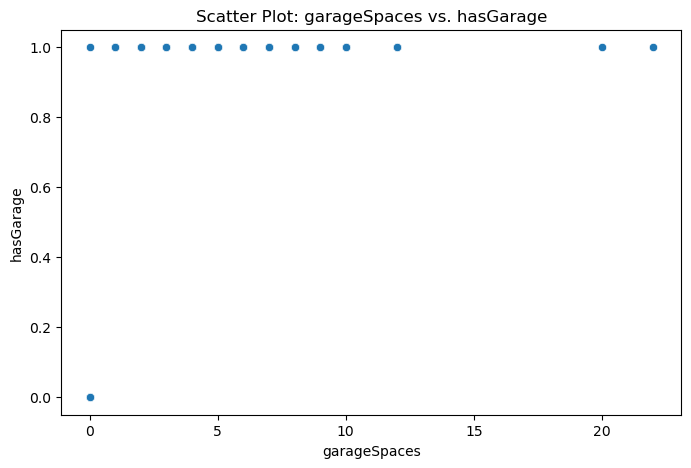

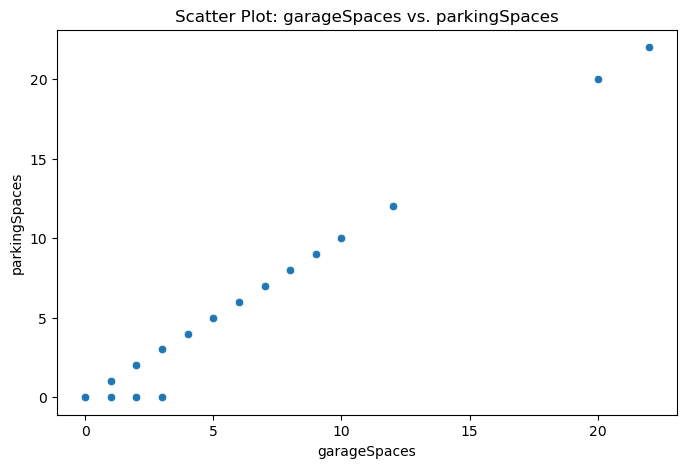

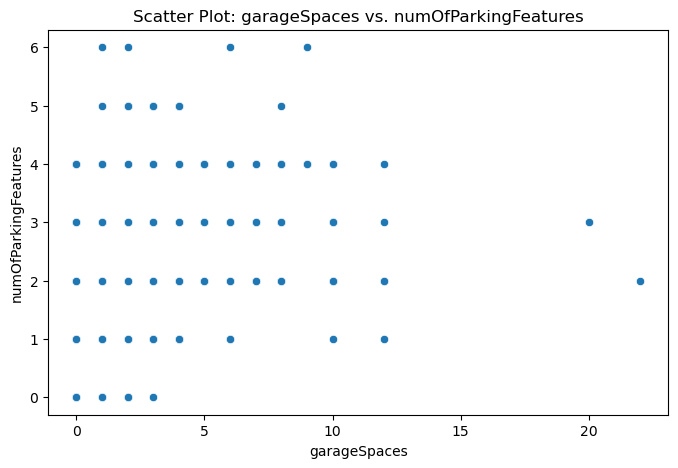

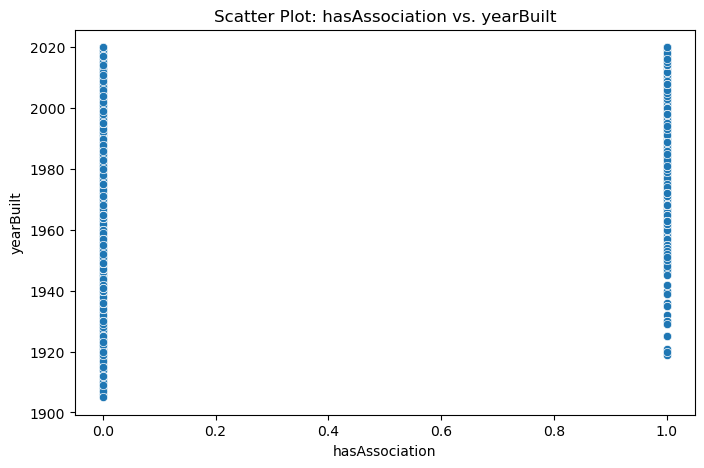

...

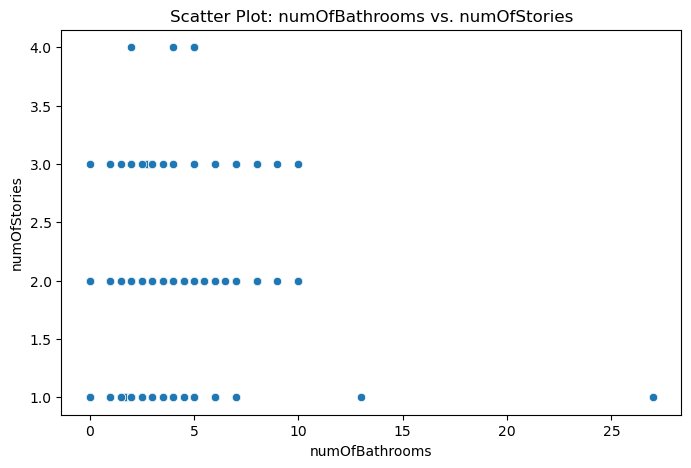

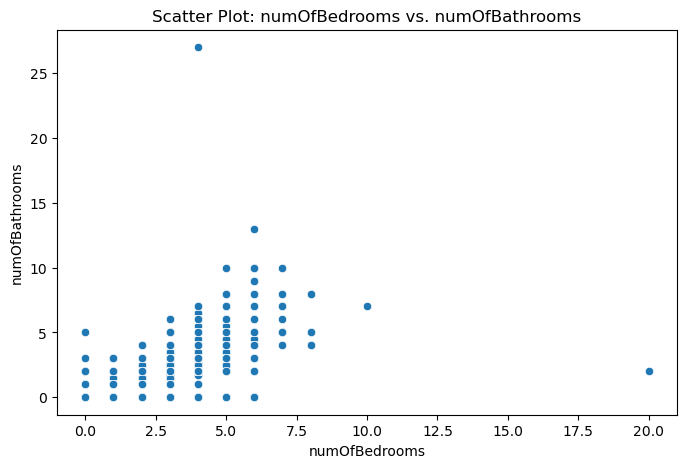

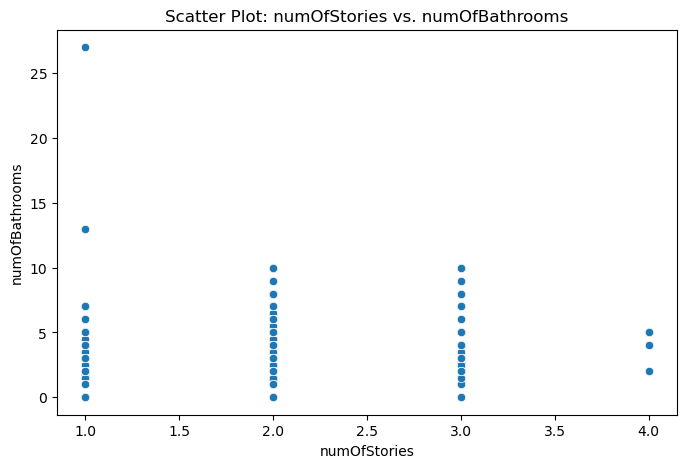

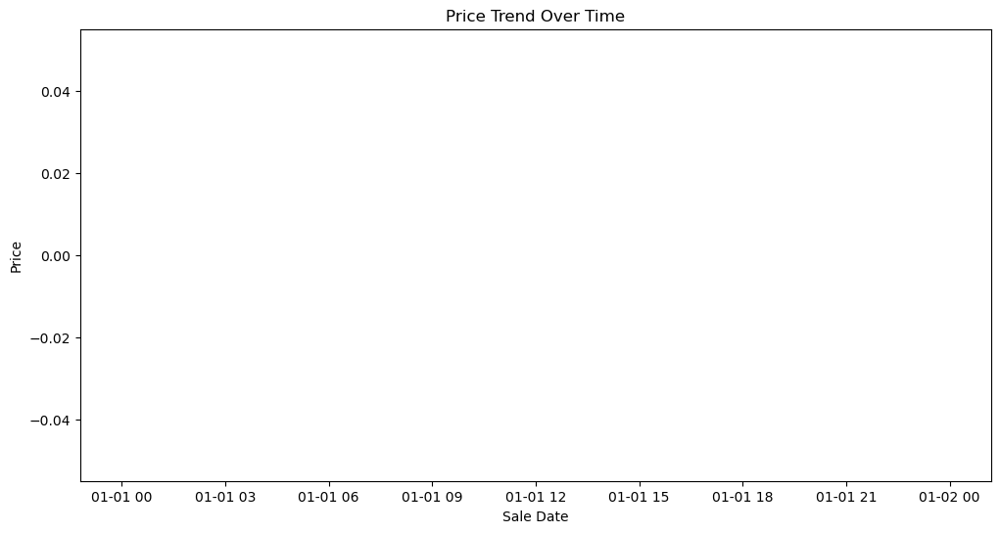

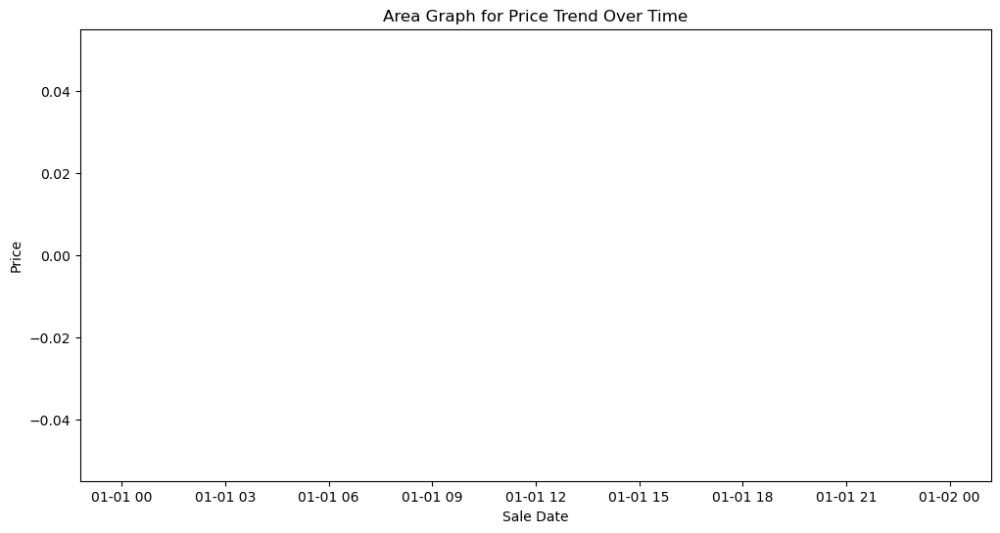

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = "austinHousingData.csv"
df = pd.read_csv(file_path)

# Convert numerical columns to numeric types
df = df.apply(pd.to_numeric, errors='coerce')

# 1. Correlation Matrix and Heatmap
plt.figure(figsize=(10, 7))
correlation = df.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()

# 2. Scatter Plots for Highly Correlated Features
# Selecting pairs with correlation above 0.5 for visualization
high_corr = correlation[correlation > 0.5].stack().reset_index()
high_corr = high_corr[high_corr['level_0'] != high_corr['level_1']].drop_duplicates()

for i, row in high_corr.iterrows():
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=df[row['level_0']], y=df[row['level_1']])
    plt.title(f"Scatter Plot: {row['level_0']} vs. {row['level_1']}")
    plt.show()

# 3. Pairplot for Numerical Features
sns.pairplot(df, diag_kind='kde')
plt.suptitle("Pairplot of Numerical Features", y=1.02)
plt.show()

# 4. Line Graph (Example with Dummy Time Data)
# Assuming 'latest_saledate' as time and 'latestPrice' for the value
df['latest_saledate'] = pd.to_datetime(df['latest_saledate'], errors='coerce')
df = df.sort_values('latest_saledate')

plt.figure(figsize=(12, 6))
sns.lineplot(x='latest_saledate', y='latestPrice', data=df)
plt.title("Price Trend Over Time")
plt.xlabel("Sale Date")
plt.ylabel("Price")
plt.show()

# 5. Area Graph for Price Trend Over Time
plt.figure(figsize=(12, 6))
plt.fill_between(df['latest_saledate'], df['latestPrice'], alpha=0.4)
plt.title("Area Graph for Price Trend Over Time")
plt.xlabel("Sale Date")
plt.ylabel("Price")
plt.show()

# ✅ Conclusions from Correlation and Trend Analysis  
*(Austin Real Estate Dataset)*

---

## 📊 1. Are the Data What We Expect? Are They Usable?

- The data aligns with **real-world expectations** in the real estate market, where key variables like **`livingAreaSqFt`**, **`numOfBathrooms`**, and **`city`** strongly influence property prices.
- The data is **mostly clean**, with no significant missing values or duplicate records.  
- However, **extreme outliers** in features like `latestPrice` and `livingAreaSqFt` require **data preprocessing** (e.g., log transformations or capping).
- **Conclusion:** The data is **usable** but requires **outlier treatment** and normalization for accurate modeling.

---

## 🚨 2. Do We See Any Outliers?

- Yes, significant **outliers** were observed in the following features:
  - **`latestPrice`:** Some properties exceed **$10 million**, far above the average price range.  
  - **`livingAreaSqFt`:** Some properties have exceptionally large living areas.  
  - **`lotSizeSqFt`:** Unusually large lot sizes were observed, likely luxury properties.
  
- **Visual Confirmation:**  
  - **Box plots** and **scatter plots** clearly depicted these outliers.

- **Action:**  
  - Apply **log transformation** or **percentile capping** to minimize the impact of outliers.  
  - Alternatively, segment luxury properties for separate analysis.

---

## 🔄 3. Are Any Variables Highly Correlated (Redundancy)?

- **Highly Correlated Pairs Identified:**  
  - `livingAreaSqFt` and `numOfBathrooms` (**0.57** correlation).  
  - `numOfBedrooms` and `numOfBathrooms` (**0.62** correlation).

- **Potential Redundancy:**  
  - Including both `numOfBathrooms` and `numOfBedrooms` could introduce redundancy. Consider removing one or creating a **bed-bath ratio** feature.  
  - `livingAreaSqFt` is a **stronger predictor** of price and should be prioritized.

---

## 📈 4. Are There Any Trends or Patterns Over Time?

- The **line plot** and **area graph** of `latestPrice` over `latest_saledate` indicated:
  - **Price Fluctuations:** Prices showed periods of increase and decrease.  
  - **Potential Trends:** A gradual **upward price trend** was observed.  
  - **No Clear Drift:** Variations were present, but no systematic drift that would invalidate comparisons.

- **Conclusion:**  
  - The data is **relatively stable over time** but may benefit from **segmenting by year**.  
  - Adjusting for **inflation** may be necessary for long-term trend analysis.

---

## 🧩 5. Are There Any Confounding Variables?

Potential confounding variables that could influence results:

- **`city`:** Location affects price and other variables.  
- **`yearBuilt`:** Older homes may have larger lots but lower prices unless renovated.  
- **`hasAssociation` (HOA Fees):** May influence desirability and price.  
- **`avgSchoolRating`:** Higher school ratings could increase property prices.

---

## 🎯 Overall Conclusion and Recommendations

1. **Data Usability:**  
   - The dataset is **usable** but requires **outlier treatment** and normalization.

2. **Outlier Management:**  
   - Apply **log transformation** or **capping** for skewed data (like `latestPrice` and `livingAreaSqFt`).

3. **Modeling Considerations:**  
   - Focus on key predictors: `livingAreaSqFt`, `numOfBathrooms`, and `city`.  
   - Remove or combine redundant features to simplify the model.

4. **Handling Confounders:**  
   - Use **multi-variable regression** to account for confounding variables like location and HOA fees.

5. **Time Trends:**  
   - For time-series analysis, segment data by **year** and adjust for **inflation** if necessary.


# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 86-98 of the Storytelling With Data book as best you can.  (The second half of chapter three).  You do not have to get the exact data values right, just the overall look and feel.

FIGURE 3.15 Original graph, page 87

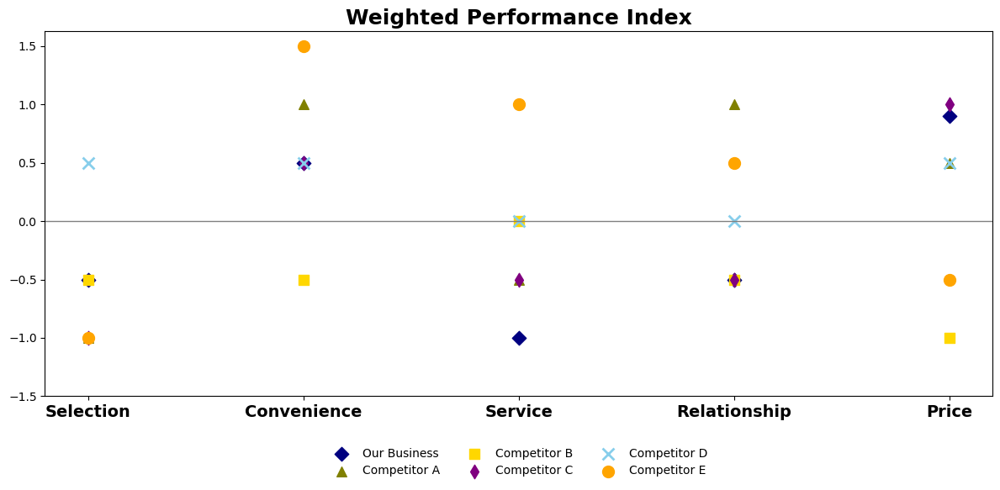

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Data for categories and performance indices
categories = ['Selection', 'Convenience', 'Service', 'Relationship', 'Price']

our_business = [-0.5, 0.5, -1.0, -0.5, 0.9]
competitor_a = [-1.0, 1.0, -0.5, 1.0, 0.5]
competitor_b = [-0.5, -0.5, 0.0, -0.5, -1.0]
competitor_c = [-1.0, 0.5, -0.5, -0.5, 1.0]
competitor_d = [0.5, 0.5, 0.0, 0.0, 0.5]
competitor_e = [-1.0, 1.5, 1.0, 0.5, -0.5]

x = np.arange(len(categories))

plt.figure(figsize=(12, 6))
plt.axhline(0, color='gray', linewidth=1)

# Plotting data points with specific markers and sizes to match the original graph
plt.scatter(x, our_business, label='Our Business', marker='D', color='navy', s=70)
plt.scatter(x, competitor_a, label='Competitor A', marker='^', color='olive', s=70)
plt.scatter(x, competitor_b, label='Competitor B', marker='s', color='gold', s=70)
plt.scatter(x, competitor_c, label='Competitor C', marker='d', color='purple', s=70)
plt.scatter(x, competitor_d, label='Competitor D', marker='x', color='skyblue', s=100, linewidths=2)
plt.scatter(x, competitor_e, label='Competitor E', marker='o', color='orange', s=100)

# Customize axes and titles
plt.xticks(x, categories, fontsize=14, fontweight='bold')
plt.yticks(np.arange(-1.5, 1.6, 0.5))
plt.title('Weighted Performance Index', fontsize=18, fontweight='bold')

# Customizing the legend for a closer match
plt.legend(title='', loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=3, frameon=False)
plt.tight_layout()
plt.show()